# Image Filtering

The main objectives of this module are:

* Implement point filtering with look-up tables.
* Implement region filtering with kernel convolution, morphological operations and edge detection.
* Understand spatial frequency information with the Fourier transform.

## 1. Look-up tables

Look-up tables are a very useful tool to perform simple pixel-level filtering of an image.

Numpy arrays indexing ([see reference here](http://docs.scipy.org/doc/numpy/user/basics.indexing.html)) is a very powerful tool, but can be a bit counter-intuitive at first. We will use it to quickly create and use look-up tables to transform an image.

Look at the short example below. 

We construct an image with 4 possible values for each pixel (-> $I(x,y) \in \{0,1,2,3\}$). We then build the following LUT:

|Input value|Output value|
|--|--|
|0|2|
|1|3|
|2|1|
|3|0|

And we apply it on the image.

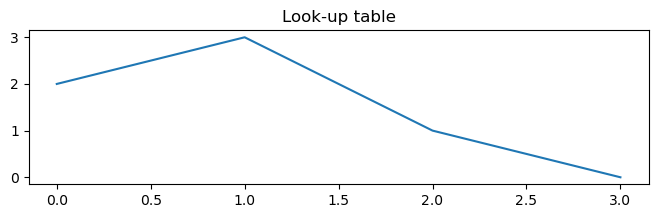

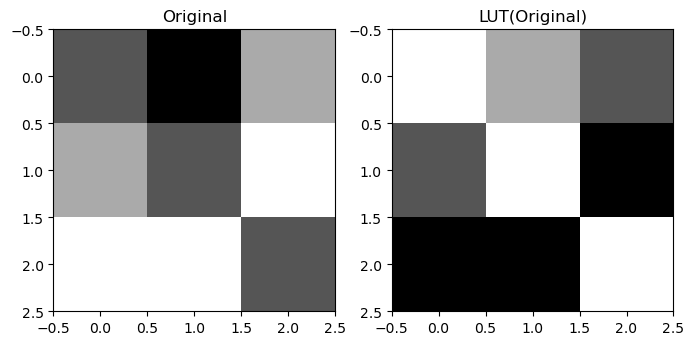

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

# Let's create a 3x3 "image" with 4 possible pixel values (in [0,3])
im = np.array([[1,0,2],[2,1,3],[3,3,1]])

# look-up table is a vector of size 4 mapping the new value for the pixels of m
lut = np.array([2,3,1,0]) # maps 0 -> 2, 1 -> 3, 2 -> 1, 3 -> 0

plt.figure(figsize=(8,2))
plt.plot(lut)
plt.title('Look-up table')
plt.show()

# we can use numpy vector indexing to apply the look-up table:
new_im = lut[im] # This will create a new array with the same size as m

plt.figure(figsize=(8,4))
plt.subplot(1,2,1) #supblot is useful to display images side-by-side
plt.imshow(im, cmap=cm.gray)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(new_im, cmap=cm.gray)
plt.title('LUT(Original)')
plt.show()

**Starting from this example, create the following LUTs** and apply them to the "walking.jpg" image:
1. For inverting an image (so that $0 \rightarrow 255$, $255 \rightarrow 0$)
1. To keep only graylevel such that $g \ge t$, setting all other values to 0.
1. To reduce the number of gray levels from 256 to 8 (so that $255 \rightarrow 7$, $0 \rightarrow 0$).
1. To "stretch" the histogram so that, given a **minimum value** $T_{min}$ and a **maximum value** $T_{max}$, we have :
    * If $I(x,y) < T_{min}$, the new value is set to 0
    * If $I(x,y) > T_{max}$, the new value is set to 255
    * Values between $T_{min}$ and $T_{max}$ are stretched to cover the entire histogram.
1. to perform an **equalization** of the cameraman image (so that the histogram becomes "as flat as possible")

(799, 640) uint8


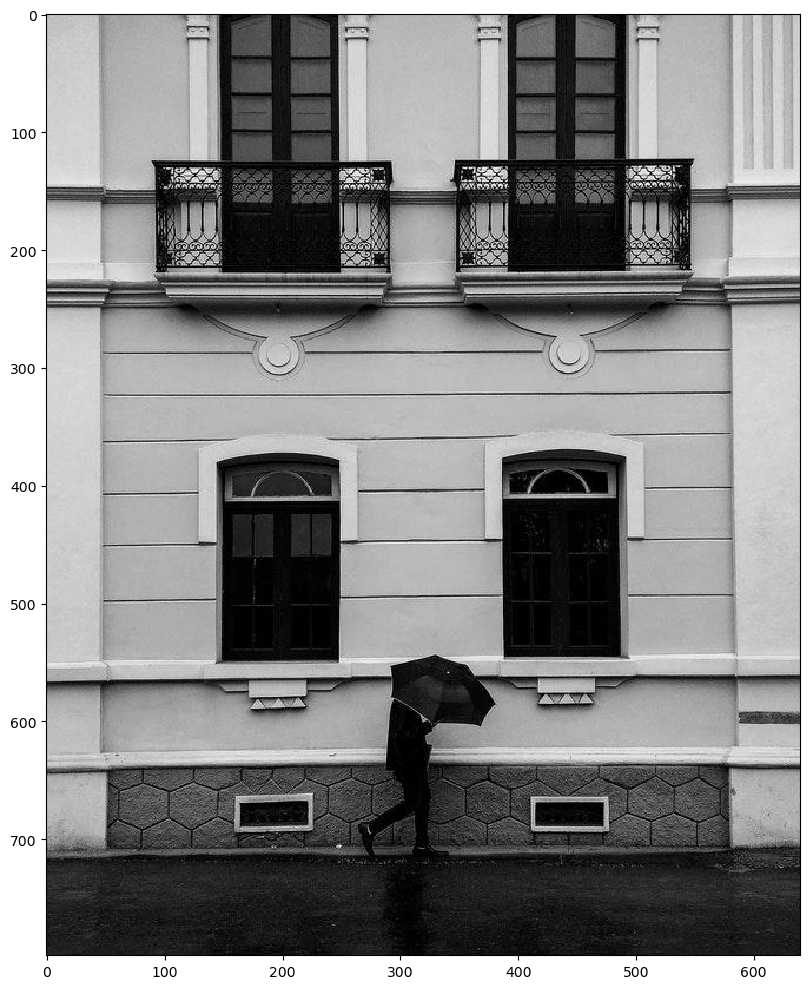

/home/max/anaconda3/lib/python3.9/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


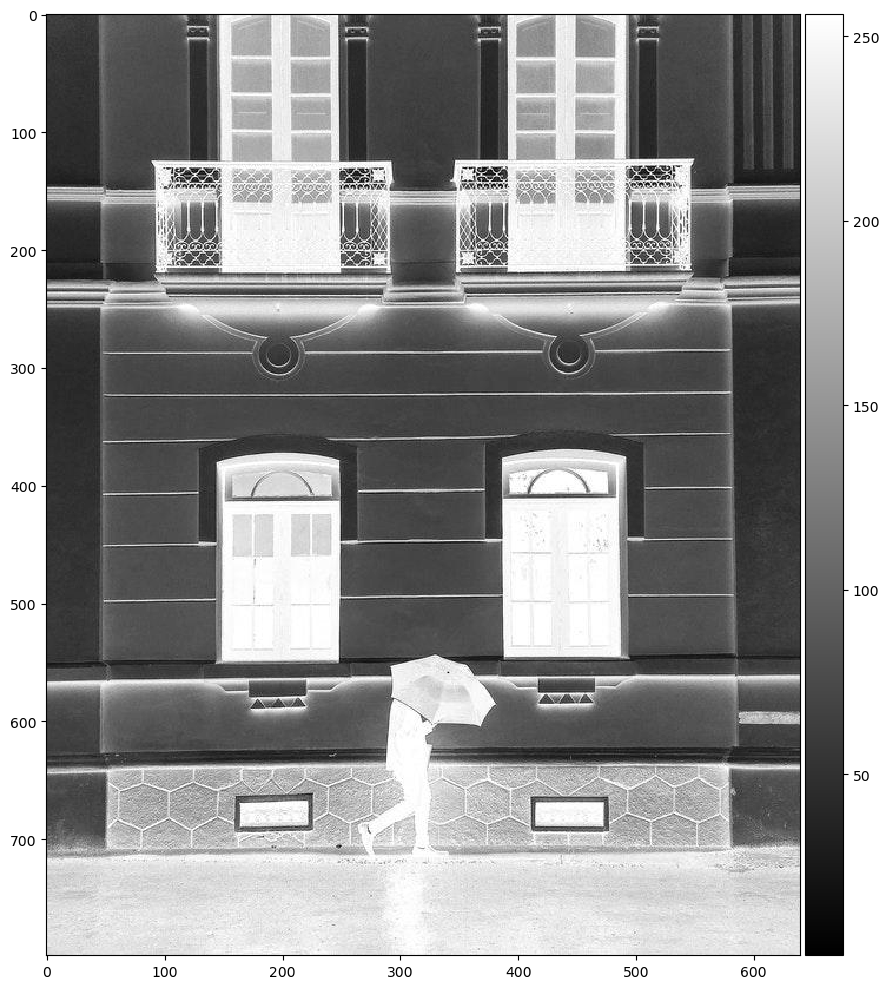

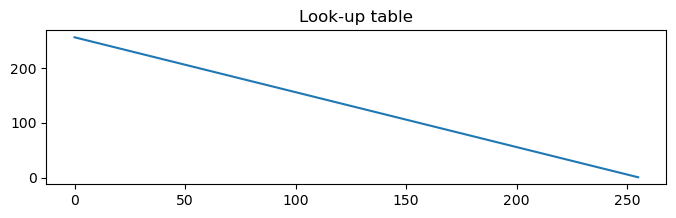

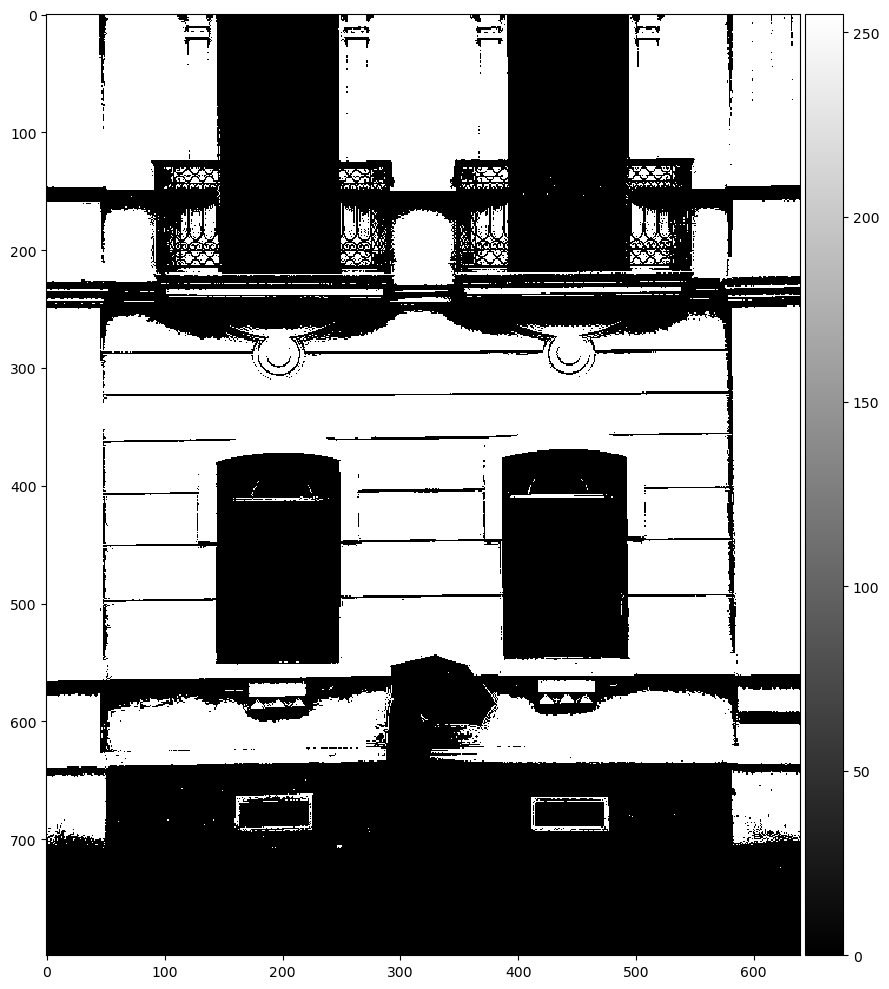

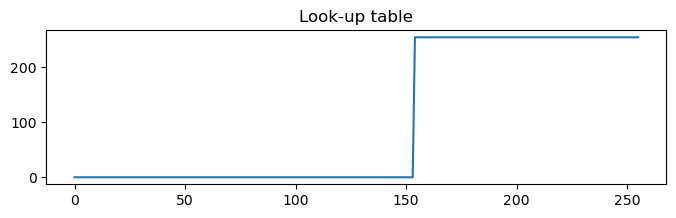

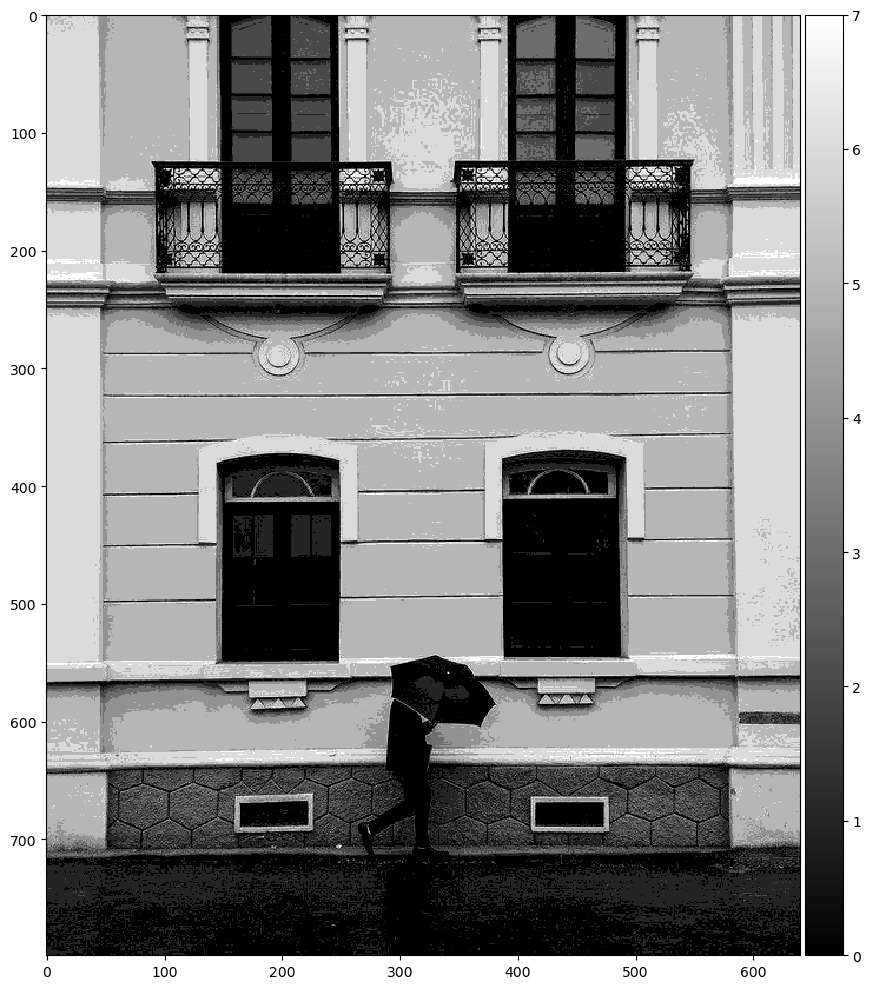

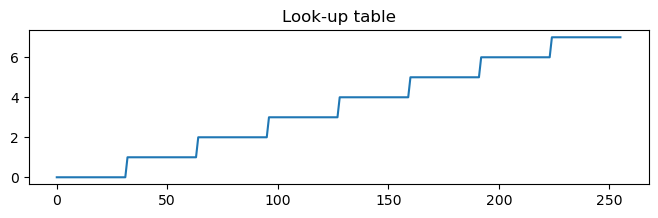

In [17]:
from skimage.io import imread,imshow,imsave

im = imread('walking.jpg')
print(im.shape, im.dtype)
plt.figure(figsize=(10,10))
imshow(im)
plt.show()

# 1 invert lut
lut = np.array(range(256,0,-1))
new_im = lut[im]

plt.figure(figsize=(10,10))
imshow(new_im, cmap=cm.gray)
plt.show()
plt.figure(figsize=(8,2))
plt.plot(lut)
plt.title('Look-up table')
plt.show()

# 2 treshold lut
t = 0.6
lut2 = np.array(([0] * round(256 * t)) + ([255] * round(256 * (1 - t))))
new_im2 = lut2[im]

plt.figure(figsize=(10,10))
imshow(new_im2, cmap=cm.gray)
plt.show()
plt.figure(figsize=(8,2))
plt.plot(lut2)
plt.title('Look-up table')
plt.show()

# 3 8 stages stare lut
list = []
for i in range(8): list += [i] * 32
lut3 = np.array(list)
new_im3 = lut3[im]

plt.figure(figsize=(10,10))
imshow(new_im3, cmap=cm.gray)
plt.show()
plt.figure(figsize=(8,2))
plt.plot(lut3)
plt.title('Look-up table')
plt.show()

**Need more help? You can check the following videos:**

* [Look-Up Tables](https://www.youtube.com/watch?v=PHiiKoSsVac&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=13)
* [Auto-levels](https://www.youtube.com/watch?v=DLN4jfBJakQ&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=14)
* [Equalization](https://www.youtube.com/watch?v=C44WuMUudik&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=15)

## 2. Kernel convolution

Kernal convolution allows us to filter an image based on the values of a neighborhood.

Write a program that applies a 3x3 kernel convolution on an image. Use it on the "walking" image to perform a mean filter.

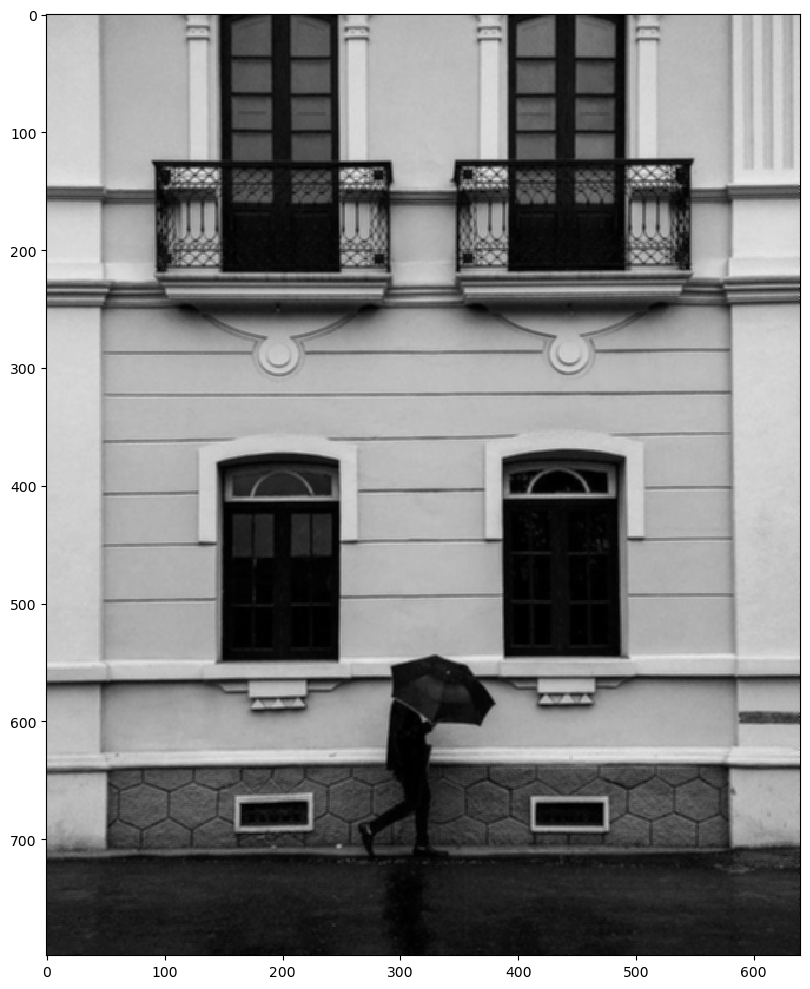

In [18]:
# Apply a mean filter via a 3*3 kernel
def conv(im):
    newIm = im.copy()
    for i in range(1,im.shape[0]-1):
        for j in range(1,im.shape[1]-1):
            newIm[i,j] = round(np.mean(im[i-1:i+2,j-1:j+2]))
    return newIm
    

im = imread('walking.jpg')

newIm = conv(im)
plt.figure(figsize=(10,10))
imshow(newIm)
plt.show()



Using the [median filter](https://scikit-image.org/docs/stable/api/skimage.filters.rank.html#skimage.filters.rank.median) and the [mean filter](https://scikit-image.org/docs/dev/api/skimage.filters.rank.html#skimage.filters.rank.mean) from scikit-image, compare the behaviour of the two filters with neighborhood of increasing sizes on the "noisy" astronaut image:

NameError: name 'cm' is not defined

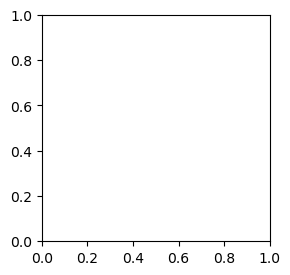

In [39]:
from skimage.filters.rank import mean, median
from skimage.morphology import disk


im = imread('astronaut_noisy.jpg')
meanIm = mean(im, disk(3))
meanIm2 = mean(im, disk(5))
meanIm3 = mean(im, disk(7))

medianIm = median(im, disk(3))
medianIm2 = median(im, disk(5))
medianIm3 = median(im, disk(7))

# Display the results
plt.figure(figsize=(10,10))
plt.subplot(3,3,1)
plt.imshow(im, cmap=cm.gray)
plt.title('Original')
plt.subplot(3,3,2)
plt.imshow(meanIm, cmap=cm.gray)
plt.title('Mean 3x3')
plt.subplot(3,3,3)
plt.imshow(meanIm2, cmap=cm.gray)
plt.title('Mean 5x5')
plt.subplot(3,3,4)
plt.imshow(meanIm3, cmap=cm.gray)
plt.title('Mean 7x7')
plt.subplot(3,3,5)
plt.imshow(medianIm, cmap=cm.gray)
plt.title('Median 3x3')
plt.subplot(3,3,6)
plt.imshow(medianIm2, cmap=cm.gray)
plt.title('Median 5x5')
plt.subplot(3,3,7)
plt.imshow(medianIm3, cmap=cm.gray)
plt.title('Median 7x7')

plt.show()



**Need more help? You can check the following videos:**

* [Kernel convolution](https://www.youtube.com/watch?v=FaTvGWPnLng&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=16)
* [Mean and Median filters](https://www.youtube.com/watch?v=GLTuF3lwDLs&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=17)

## 3. 2D Fourier transform

The 2D Fourier transform allows us to get a representation of the spatial frequencies present in an image. A very powerful way of filtering images is to modify those frequencies directly by modifying the "Fourier image", and to use the inverse transform to get the pixel values of the filtered image.

Let's illustrate that with a fake example. We start with a completely random signal and compute the Fourier transform. Note that the Fourier image is complex, so we use its amplitude. As the range of amplitudes is so high that we don't see much in the resulting image, we display the log of the amplitude.

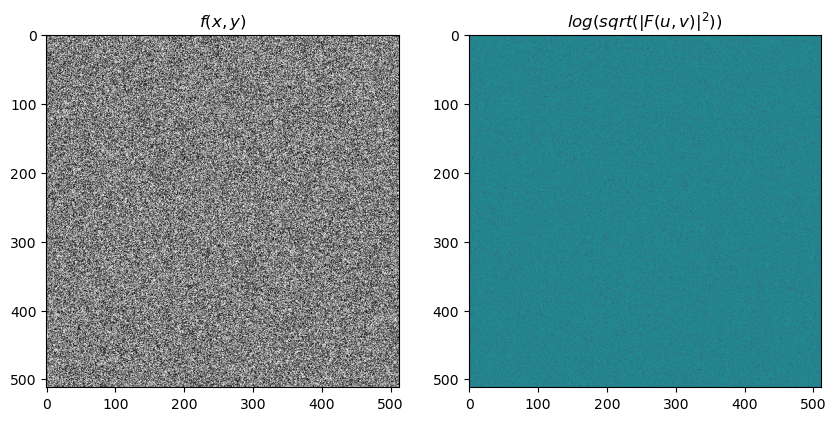

In [ ]:
from numpy.fft import fft2,ifft2,fftshift,ifftshift
# fft2 -> Fourier transform
# ifft2 -> Inverse transform
# fftshift & ifftshift -> reorganize the "Fourier image" to make it more easily interpretable.

im = np.random.random((512,512))
f = fftshift(fft2(im))
amplitude = np.sqrt(np.real(f)**2+np.imag(f)**2)

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(np.log(amplitude))# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.show()

We could now, for instance, decide to add an horizontal frequency by creating peaks in the Fourier image on the horizontal axis. The further away from the center we put the peaks, the higher the frequency.

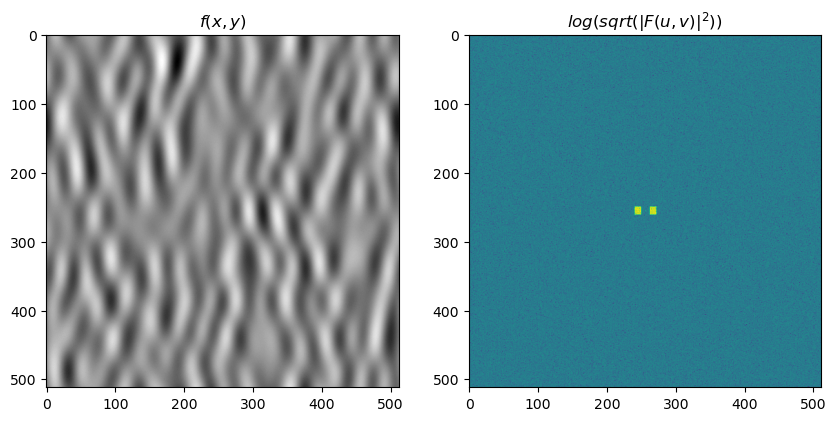

In [ ]:
f2 = f.copy()
f2[250:262,262:272] *= 1000
f2[250:262,240:250] *= 1000
amplitude = np.sqrt(np.real(f2)**2+np.imag(f2)**2)
im2 = ifft2(ifftshift(f2)).real

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im2,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(np.log(amplitude))# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.show()

Now we could also decide to mask the central region, which would remove the peaks that we just created and put all those values at zero. The image will once again look random:

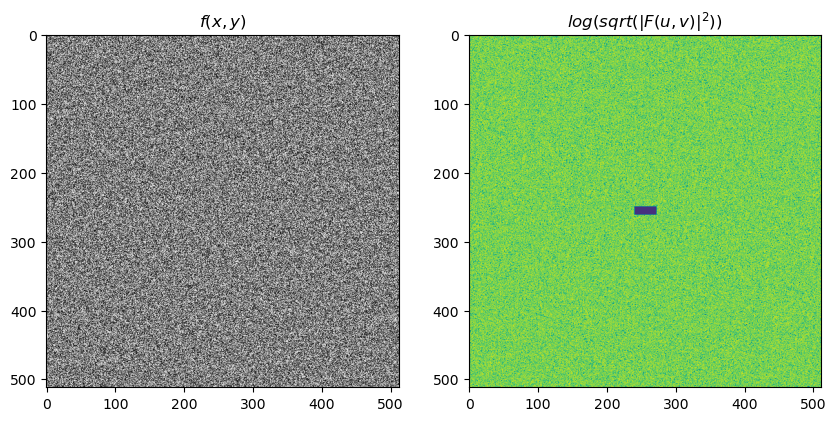

In [ ]:
f3 = f2.copy()
f3[250:262,240:272] = 0
amplitude = np.sqrt(np.real(f3)**2+np.imag(f3)**2)
im3 = ifft2(ifftshift(f3)).real

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im3,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(np.log(amplitude, where=amplitude>0))
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.show()

Starting from those examples and the code below:

1. Use the Fourier transform to reduce the [dithering](https://en.wikipedia.org/wiki/Dither) of the *moire.png* image by building a low-pass filter.
1. Build a high-pass filter using Fourier transform and apply the filter to the "walking" image.

/tmp/ipykernel_34134/1017924859.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = imread('moire1.png').astype(np.float)


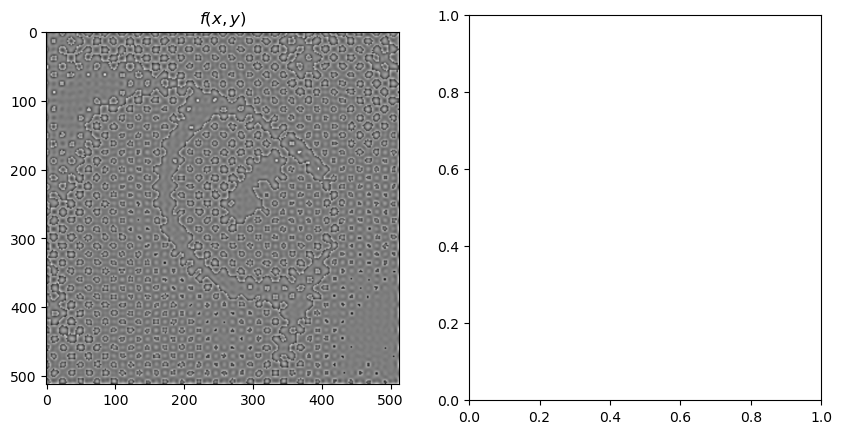

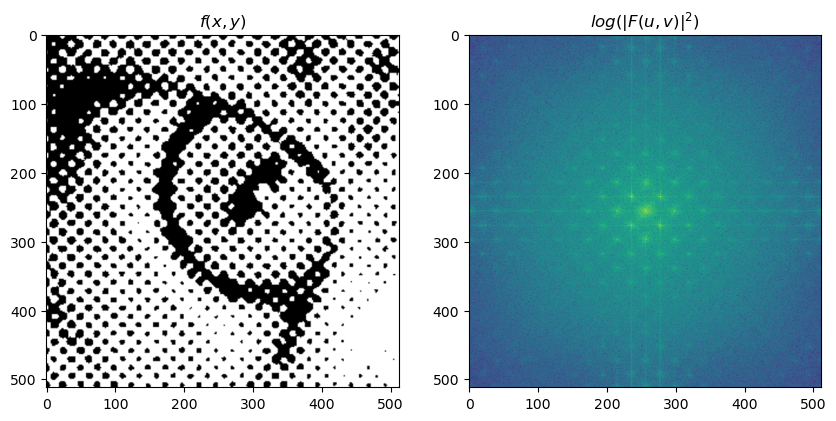

In [ ]:
im = imread('moire1.png').astype(np.float)
f = fftshift(fft2(im)) # shift Fourier image so that the center corresponds to low frequencies

# Modify the fourier transform to apply a low pass filter on the image

flp = f.copy()
flp[200:300,200:300] = 0

newIm = ifft2(ifftshift(flp)).real

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(newIm,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)

amplitude = np.sqrt(np.real(f)**2+np.imag(f)**2)

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(np.log(amplitude))# show log so as to see more than just the global maximum
plt.title('$log(|F(u,v)|^2)$')
plt.show()



In [ ]:

## -- Your code here -- ##


**Need more help? You can check the following videos:**

* [Understanding the 2D Fourier transform](https://www.youtube.com/watch?v=bsNQpeBZ7IY&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=18)
* [Filters in Fourier space](https://www.youtube.com/watch?v=8g-sE7wkKpU&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=19)

## 4. Morphological operations

* For morphology functions, [see the skimage documentation](http://scikit-image.org/docs/dev/api/skimage.morphology.html?highlight=morphology#module-skimage.morphology)

Starting from the example below:

1. Using the "opening" operation with a disk structuring element of increasing size, determine how many circles of any given radius there are in the *circles.png* image.
1. Build a morphological filter that eliminates one size of circles.

Text(0.5, 1.0, 'dilation')

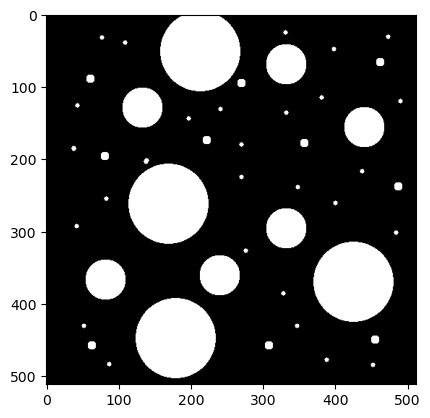

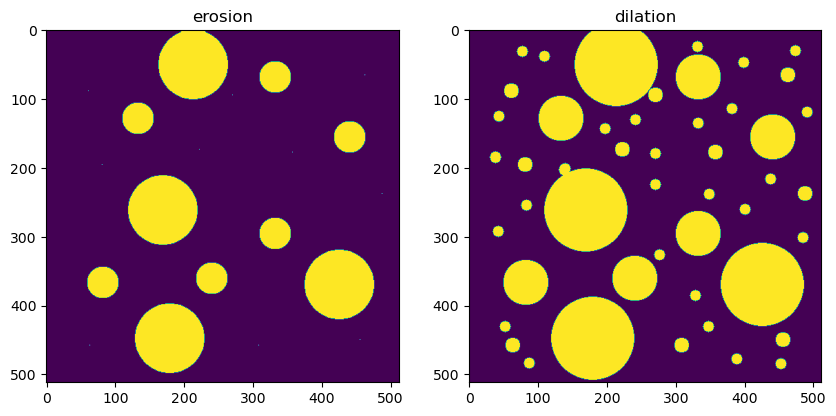

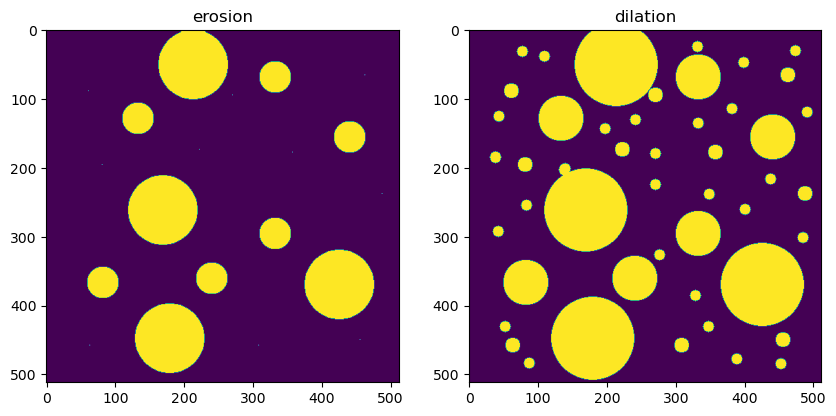

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.io import imread
from skimage.morphology import disk, erosion, dilation

im = imread('circles1.png')==0 #to be sure objects are = 1
plt.imshow(im,cmap=plt.cm.gray);

# use the local maximum and local minimum for dilation and erosion
eroded_image = erosion(im,disk(5))
dilated_image = dilation(im,disk(5))

plt.figure(figsize=[10,8])
plt.subplot(1,2,1)
plt.imshow(eroded_image)
plt.title('erosion')
plt.subplot(1,2,2)
plt.imshow(dilated_image)
plt.title('dilation')

# note that "erosion" and "dilation" are the same as the "local minimum" and "local maximum" :
from skimage.filters.rank import minimum,maximum
eroded_image = minimum(im.astype('uint8'), disk(5))
dilated_image = maximum(im.astype('uint8'), disk(5))

plt.figure(figsize=[10,8])
plt.subplot(1,2,1)
plt.imshow(eroded_image)
plt.title('erosion')
plt.subplot(1,2,2)
plt.imshow(dilated_image)
plt.title('dilation')

**Need more help? You can check the following videos:**

* [Morphological operations](https://www.youtube.com/watch?v=b64M2dZaWPA&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=20)

## 5. Edge detection

Using the [convolve2d](http://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.signal.convolve2d.html) function, develop the Sobel filter. 
The Sobel operator is given by
$$\mathbf{G} = \sqrt{ {\mathbf{G}_x}^2 + {\mathbf{G}_y}^2 }$$
where $G_x$ and $G_y$ are images respectively obtained by a convolution with the given kernels
$$\mathbf{g}_y = \begin{bmatrix} 
    -1 & -2 & -1  \\
    0 & 0 & 0 \\
    +1 & +2 & +1 
    \end{bmatrix}
    \quad
    \mbox{and}
    \quad   
    \mathbf{g}_x = \begin{bmatrix} 
    -1 & 0 & +1 \\
    -2 & 0 & +2 \\
    -1 & 0 & +1 
    \end{bmatrix}
    $$

**Apply the Sobel filter** to find the edges in the "road" image.

Compare with the results of the **Canny edge filter** with different "sigma" values (see [the skimage documentation](http://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html))

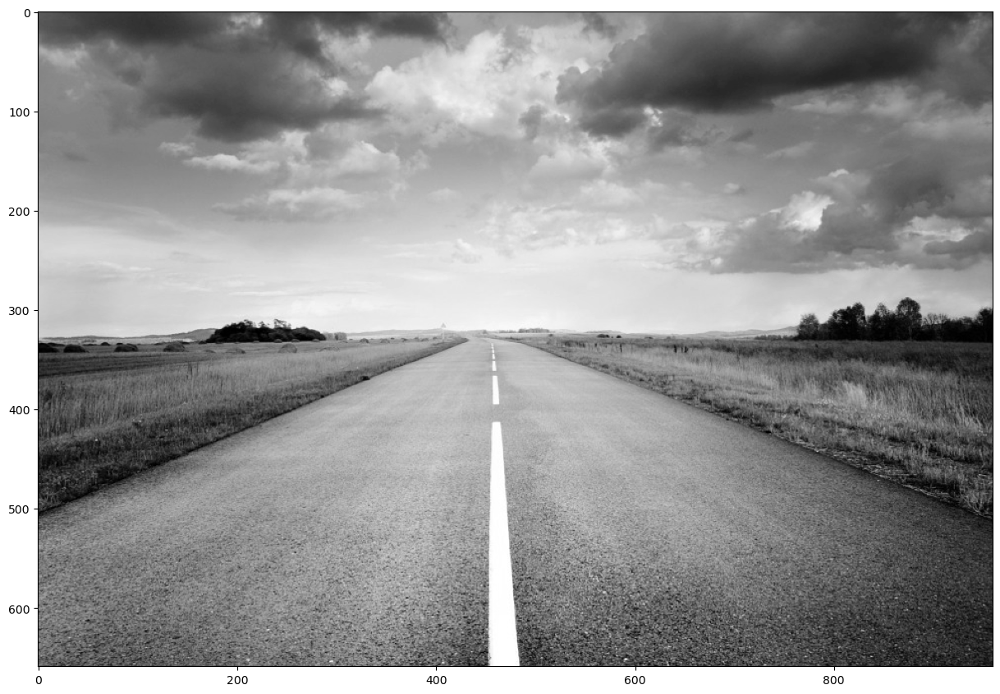

In [ ]:
from skimage.data import camera
from skimage.io import imread

im = imread('road.jpg', as_gray=True)

plt.figure(figsize=(15,15))
plt.imshow(im, cmap=plt.cm.gray)
plt.show()

## -- Your code here -- ##


Use the **[Hough transform](http://scikit-image.org/docs/dev/auto_examples/edges/plot_line_hough_transform.html)** to find the main straight lines in the road image, using the results from the Canny edge detector.

In [ ]:

## -- Your code here -- ##


**Need more help? You can check the following videos:**

* [Edge detection with the Sobel filter](https://www.youtube.com/watch?v=QCjh8yyW-Wo&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=21)
* [Edge detection with the Canny transform](https://www.youtube.com/watch?v=yS5NnpWmuuI&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=22)
* [Line detection with the Hough Transform](https://www.youtube.com/watch?v=GD2xipfKQyY&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=23)

# Coding project - Picture enhancement

Write code that automatically enhances a photograph.

<img src="etretat.jpg" width="250px" />
<img src="ex_enhance.jpg" width="250px" />

"Enhance" may mean a lot of different things, and we encourage you to be creative in which enhancements you want to implement.

Some possibilities include (not an exhaustive list):

* Noise reduction
* Auto-level
* Gamma correction (with gamma provided by the user or automatically determined from the image histogram)
* Increase colour saturation
* ...

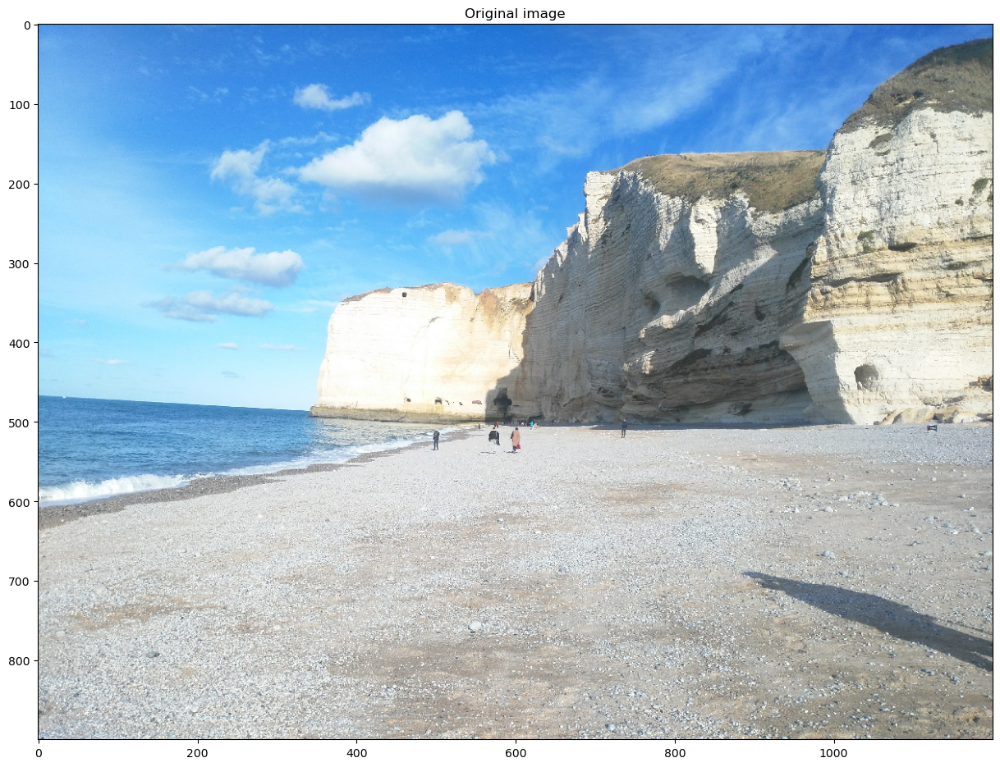

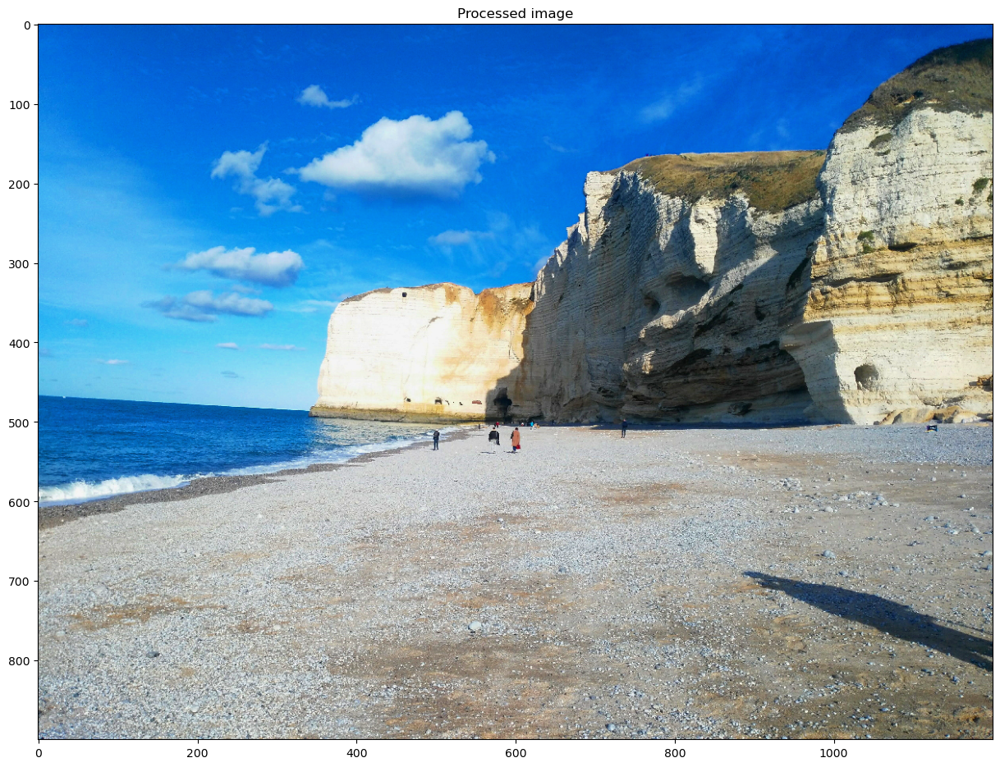

In [66]:
import numpy as np
from skimage import exposure
from skimage.io import imread,imsave,imshow
from matplotlib import pyplot as plt
import skimage
from numpy.fft import fft2,ifft2,fftshift,ifftshift



# gamma correction
def adjustGamma(image, gamma=None):
    if gamma is None:
        return exposure.adjust_gamma(image)
    else:
       return exposure.adjust_gamma(image, gamma)


def increaseContrast(image, contrastValue):
    # Convert image to float type
    image = skimage.img_as_float(image)
    
    # Calculate the mean intensity of the image
    meanIntensity = np.mean(image)
    
    # Calculate the output image
    newImage = image + (image - meanIntensity) * contrastValue
    
    return newImage


def increaseaturation(image, saturationValue):
    # Convert image to float type
    image = skimage.img_as_float(image)
    # Calculate the mean intensity of the image
    meanIntensity = np.mean(image)
    # Calculate the output image
    newImage = image + (image - meanIntensity) * saturationValue
    
    return newImage

def lowPassFilter(im):
    f = fftshift(fft2(im)) # shift Fourier image so that the center corresponds to low frequencies
    flp = f.copy()
    flp[225:275,225:275] = 0
    newIm = ifft2(ifftshift(flp)).real
    return newIm

def increaseSaturation(image, saturation_value):
    # Convert image to float type
    image = skimage.img_as_float(image)
    # Convert image to HSV color space
    hsvImage = skimage.color.rgb2hsv(image)
    # Modify the saturation channel
    hsvImage[:,:,1] *= saturation_value
    # Clip the saturation values to the range [0, 1]
    hsvImage[:,:,1] = np.clip(hsvImage[:,:,1], 0, 1)
    # Convert image back to RGB color space
    newImage = skimage.color.hsv2rgb(hsvImage)
    
    return newImage


def autolevel(image):
    # Convert image to float type
    image = skimage.img_as_float(image)
    
    # Calculate the minimum and maximum intensity values
    min_intensity = np.min(image)
    max_intensity = np.max(image)
    
    # Stretch the intensity values to the range [0, 1]
    output_image = (image - min_intensity) / (max_intensity - min_intensity)
    
    return output_image


im = imread('etretat.jpg')

plt.figure(figsize=(15,15))
plt.imshow(im)
plt.title('Original image')
plt.show()


im = adjustGamma(im,1.2)
im = increaseContrast(im,0.2)
im = increaseSaturation(im,1.5)
im = lowPassFilter(im)
im = autolevel(im)

plt.figure(figsize=(15,15))
plt.title('Processed image')
plt.imshow(im)
plt.show()